## AI Courses by OpenCV

Want to become an expert in AI? [AI Courses by OpenCV](https://opencv.org/university/) is a great place to start.

[![img](https://learnopencv.com/wp-content/uploads/2023/01/AI-Courses-By-OpenCV-Github.png)](https://opencv.org/courses/)

## Library Imports

In [2]:
#importing libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt
#plt.rcParams['image.cmap'] = 'gray'

import requests
import zipfile
import os

In [9]:
def download_and_unzip(dropbox_link):
    '''
    Download and unzip Dataset.

    params:
          dropbox_link (str): Download link for source dataset.
    '''
    # Set the output directory path
    output_dir = '/home/ankan_opencv/officework/VS_Code/Noteboks-indore-talk/' #replace this with path/to/your/dir

    # Extract the filename from the Dropbox link
    filename = dropbox_link.split('/')[-1]

    # Download the zip file
    response = requests.get(dropbox_link)
    zip_path = os.path.join(output_dir, filename)
    with open(zip_path, 'wb') as f:
        f.write(response.content)

    # Extract the contents of the zip file
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(output_dir)

    # Remove the zip file
    os.remove(zip_path)

    # Print success message
    print(f"Zip file downloaded and extracted to: {output_dir}")

In [10]:
# Function call to dowload_and_unzip() - ORIGINAL DATASET
dropbox_link = "https://www.dropbox.com/scl/fi/49ra8kymd9w7364l13jkn/indore-talk-2024.zip?rlkey=2y2fp77fzz9ehb750jv12vq66&dl=1"
download_and_unzip(dropbox_link)

Zip file downloaded and extracted to: /home/ankan_opencv/officework/VS_Code/Noteboks-indore-talk/


## Reading an Image

In [3]:
# Load a color image
image = cv2.imread('/home/ankan_opencv/officework/VS_Code/Noteboks-indore-talk/indore-talk-2024/dog.jpg')
image = cv2.resize(image, (620, 480))

## Displaying an Image

In [13]:
# If the image is not loaded, print an error message
if image is None:
    print('Error loading image')
else:
    # Display the image
    cv2.imshow('Image', image)
    cv2.waitKey(0) # press Q to exit
    cv2.destroyAllWindows()

## Writing the Image

In [14]:
# Save the image to a file in JPEG format
retval = cv2.imwrite('output_image.jpg', image)

if retval:
    print("Image saved successfully.")
else:
    print("Failed to save the image.")

Image saved successfully.


## Split the Image Channel

(2436, 2623, 4)


Text(0.5, 1.0, 'Alpha')

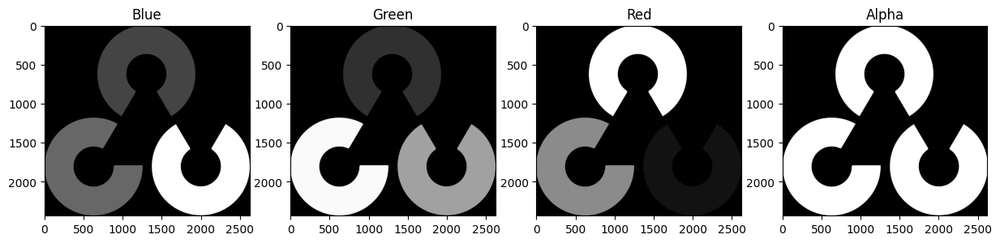

In [15]:
# Read the PNG image using: cv2.IMREAD_UNCHANGED to retain the alpha channel.
img = cv2.imread('/home/ankan_opencv/officework/VS_Code/Noteboks-indore-talk/indore-talk-2024/opencv_logo.png', cv2.IMREAD_UNCHANGED)

print(img.shape)

# Split the channels.
b, g, r, a = cv2.split(img)

# Display eazch of the channels.
plt.figure(figsize = (15,15))
plt.subplot(141); plt.imshow(b, cmap='gray'); plt.title('Blue')
plt.subplot(142); plt.imshow(g, cmap='gray'); plt.title('Green')
plt.subplot(143); plt.imshow(r, cmap='gray'); plt.title('Red')
plt.subplot(144); plt.imshow(a, cmap='gray'); plt.title('Alpha')

## Merge the Image Channels

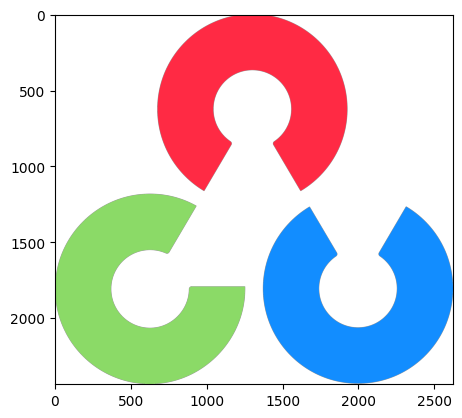

In [16]:
img_m = cv2.merge([r,g,b,a])
plt.imshow(img_m)

## Resize the Images

In [17]:
# resize the image to 200x200px, ignoring aspect ratio
resized = cv2.resize(image, (200, 200))
cv2.imshow("Fixed Resizing", resized)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [19]:
# fixed resizing and distort aspect ratio so let's resize the width
# to be 300px but compute the new height based on the aspect ratio

h, w, c = image.shape

r = 300.0 / w
dim = (300, int(h * r))
resized = cv2.resize(image, dim)
cv2.imshow("Aspect Ratio Resize", resized)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Rotating an Image

In [20]:
# let's rotate an image 45 degrees clockwise using OpenCV by first
# computing the image center, then constructing the rotation matrix,
# and then finally applying the affine warp
center = (w // 2, h // 2)
M = cv2.getRotationMatrix2D(center, -45, 1.0)
rotated = cv2.warpAffine(image, M, (w, h))
cv2.imshow("OpenCV Rotation", rotated)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Transleting an Image

In [ ]:
# get tx and ty values for translation
# you can specify any value of your choice
tx, ty = w / 4, h / 4

# create the translation matrix using tx and ty, it is a NumPy array
translation_matrix = np.array([
    [1, 0, tx],
    [0, 1, ty]
], dtype=np.float32)

# apply the translation to the image
translated_image = cv2.warpAffine(src=image, M=translation_matrix, dsize=(w, h))

# display the original and the Translated images
cv2.imshow('Translated image', translated_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Cropping an Image

In [21]:
# Cropping an image
cropped_image = image[80:280, 150:330]

# Display cropped image
cv2.imshow("cropped", cropped_image)

cv2.waitKey(0)
cv2.destroyAllWindows()

## Annotating Images

In [28]:
#Make copy of the image
imageLine = image.copy()
# Draw the image from point A to B
pointA = (200,300)
pointB = (450,250)
cv2.line(imageLine, pointA, pointB, (255, 255, 0), thickness=3)
cv2.imshow('Image Line', imageLine)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [29]:
# Make a copy of image
imageCircle = image.copy()
# define the center of circle
circle_center = (415,190)
# define the radius of the circle
radius =100
#  Draw a circle using the circle() Function
cv2.circle(imageCircle, circle_center, radius, (0, 0, 255), thickness=3, lineType=cv2.LINE_AA) # -1 for filled circle
# Display the result
cv2.imshow("Image Circle",imageCircle)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [31]:
# make a copy of the original image
imageRectangle = image.copy()
# define the starting and end points of the rectangle
start_point =(300,115)
end_point =(475,225)
# draw the rectangle
cv2.rectangle(imageRectangle, start_point, end_point, (0, 0, 255), thickness= 3, lineType=cv2.LINE_8)
# display the output
cv2.imshow('imageRectangle', imageRectangle)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [32]:
# make a copy of the original image
imageEllipse = image.copy()
# define the center point of ellipse
ellipse_center = (415,190)
# define the major and minor axes of the ellipse
axis1 = (100,50)
axis2 = (125,50)
# draw the ellipse
#Horizontal
cv2.ellipse(imageEllipse, center, axis1, 0, 0, 360, (255, 0, 0), thickness=3)
#Vertical
cv2.ellipse(imageEllipse, center, axis2, 90, 0, 360, (0, 0, 255), thickness=3)
# display the output
cv2.imshow('ellipse Image',imageEllipse)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [33]:
# make a copy of the original image
halfEllipse = image.copy()
# define the center of half ellipse
ellipse_center = (415,190)
# define the axis point
axis1 = (100,50)
# draw the Incomplete/Open ellipse, just a outline
cv2.ellipse(halfEllipse, ellipse_center, axis1, 0, 180, 360, (255, 0, 0), thickness=3)
# if you want to draw a Filled ellipse, use this line of code
cv2.ellipse(halfEllipse, ellipse_center, axis1, 0, 0, 180, (0, 0, 255), thickness=-2)
# display the output
cv2.imshow('halfEllipse',halfEllipse)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Reading a Video

In [34]:
! pip install moviepy

In [2]:
from moviepy.editor import VideoFileClip

input_video = '/home/ankan_opencv/officework/VS_Code/Noteboks-indore-talk/indore-talk-2024/download.mp4'

# loading output video
clip = VideoFileClip(input_video)
clip.ipython_display(width = 600)

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


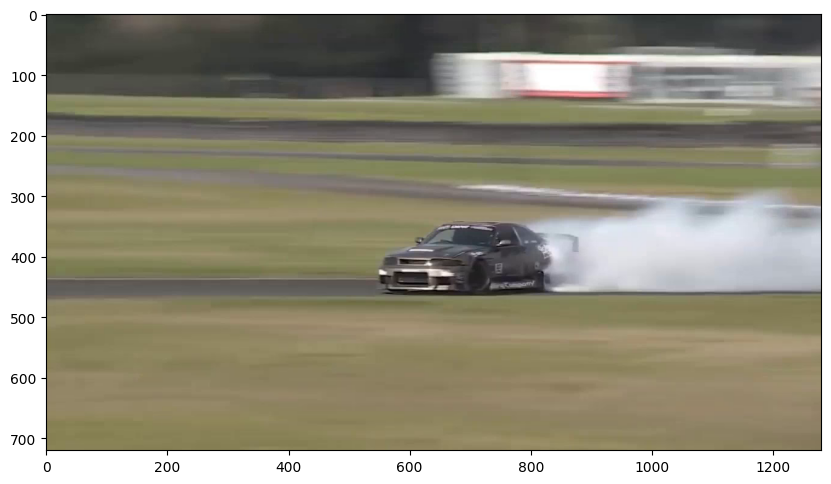

In [3]:
vid_capture = cv2.VideoCapture(input_video)
if (vid_capture.isOpened()== False):
  print("Error opening video stream or file")

ret, frame = vid_capture.read()

plt.figure(figsize = (10, 8))
plt.imshow(frame[...,::-1])

## Writing an Video

In [4]:
# Initialize the video capture
vid_capture = cv2.VideoCapture('/home/ankan_opencv/officework/VS_Code/Noteboks-indore-talk/indore-talk-2024/download.mp4')
if not vid_capture.isOpened():
    print("Error: Could not open video.")
    exit()

# Retrieve video frame properties
frame_w = int(vid_capture.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_h = int(vid_capture.get(cv2.CAP_PROP_FRAME_HEIGHT))
frame_fps = int(vid_capture.get(cv2.CAP_PROP_FPS))

# Modify the frame rate to slow down the video
frame_fps = max(1, int(frame_fps / 3))  # Ensure fps is at least 1

# Specify the FourCC code and create VideoWriter object
fourcc_mp4 = cv2.VideoWriter_fourcc(*'mp4v')
file_out_mp4 = 'video_out.mp4'
out_mp4 = cv2.VideoWriter(file_out_mp4, fourcc_mp4, frame_fps, (frame_w, frame_h))

if not out_mp4.isOpened():
    print("Error: Could not open the output video file for writing.")
    vid_capture.release()
    exit()

def drawBannerText(frame, text, banner_height_percent=0.05, text_color=(0, 255, 0)):
    banner_height = int(banner_height_percent * frame.shape[0])
    cv2.rectangle(frame, (0, 0), (frame.shape[1], banner_height), (0, 0, 0), thickness=-1)

    left_offset = 20
    location = (left_offset, int(5 + (banner_height_percent * frame.shape[0]) / 2))
    fontScale = 1.5
    fontThickness = 2
    cv2.putText(frame, text, location, cv2.FONT_HERSHEY_PLAIN, fontScale, text_color, fontThickness, cv2.LINE_AA)

frame_count = 0
while True:
    ok, frame = vid_capture.read()
    if not ok:
        break

    frame_count += 1
    drawBannerText(frame, f'Frame: {frame_count} FPS: {frame_fps}')

    out_mp4.write(frame)

# Release the VideoCapture and VideoWriter objects
vid_capture.release()
out_mp4.release()

In [5]:
from moviepy.editor import *

clip = VideoFileClip(file_out_mp4)
clip.ipython_display(width = 600)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


## Arithmetic Operations of Image

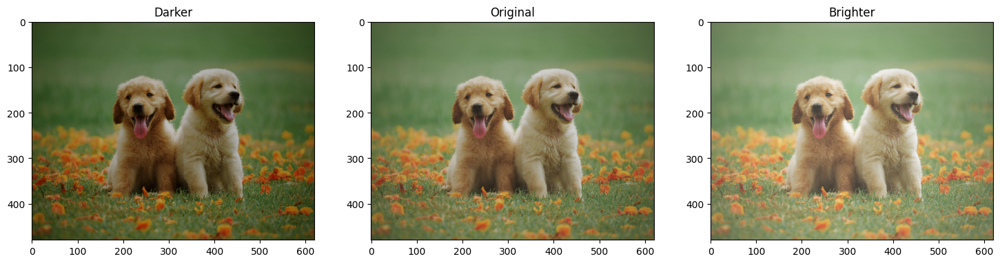

In [7]:
# Create a matrix with constant intensity.
matrix = np.ones(image.shape, dtype = 'uint8') * 30

# Create brighter and darker images.
img_brighter = cv2.add(image, matrix)
img_darker   = cv2.subtract(image, matrix)

# Display the images
plt.figure(figsize = [18,5])
plt.subplot(131); plt.imshow(img_darker[:, :, ::-1]);   plt.title('Darker')
plt.subplot(132); plt.imshow(image[:, :, ::-1]);          plt.title('Original')
plt.subplot(133); plt.imshow(img_brighter[:, :, ::-1]); plt.title('Brighter');

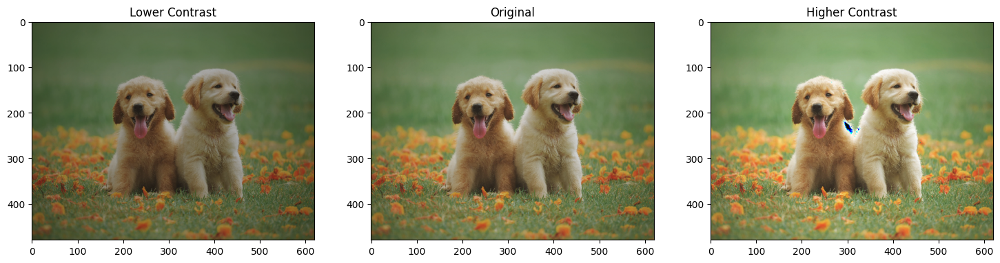

In [9]:
# Create matrices with a constant scale factor.
matrix1 = np.ones(image.shape) * 0.8
matrix2 = np.ones(image.shape) * 1.2

# Create lower and higher contrast images.
img_lower  = np.uint8(cv2.multiply(np.float64(image), matrix1))
img_higher = np.uint8(cv2.multiply(np.float64(image), matrix2))
# img_higher  = np.uint8(np.clip(cv2.multiply(np.float64(img), matrix2) , 0, 255))

# Display the images.
plt.figure(figsize = [18,5])
plt.subplot(131); plt.imshow(img_lower[:, :, ::-1]);  plt.title('Lower Contrast')
plt.subplot(132); plt.imshow(image[:, :, ::-1]);        plt.title('Original')
plt.subplot(133); plt.imshow(img_higher[:, :, ::-1]); plt.title('Higher Contrast');

## Logical Operations on Image / Color Segmentation

In [10]:
img = cv2.imread('/home/ankan_opencv/officework/VS_Code/Noteboks-indore-talk/indore-talk-2024/opencv_logo.png', 1)
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Set range for red color.
r_lb = np.array([165, 50, 50], np.uint8)
r_ub = np.array([180, 255, 255], np.uint8)

# Set range for green color.
g_lb = np.array([35, 50, 50], np.uint8)
g_ub = np.array([80, 255, 255], np.uint8)

# Set range for blue color.
b_lb = np.array([95, 50, 50], np.uint8)
b_ub = np.array([125, 255, 255], np.uint8)

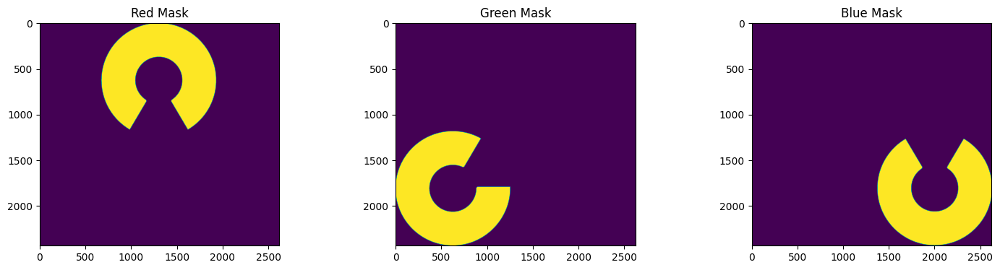

In [11]:
# Define each color mask.
r_mask = cv2.inRange(img_hsv, r_lb, r_ub)
g_mask = cv2.inRange(img_hsv, g_lb, g_ub)
b_mask = cv2.inRange(img_hsv, b_lb, b_ub)

# Display each color mask.
plt.figure(figsize = (18, 4))
plt.subplot(131); plt.imshow(r_mask); plt.title('Red Mask')
plt.subplot(132); plt.imshow(g_mask); plt.title('Green Mask')
plt.subplot(133); plt.imshow(b_mask); plt.title('Blue Mask');

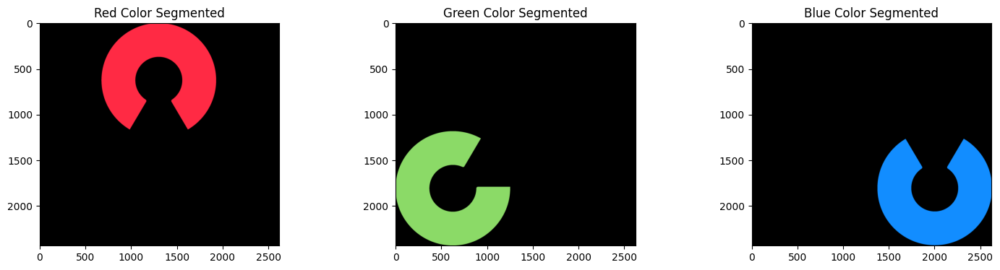

In [12]:
# Segment the colors.
r_seg = cv2.bitwise_and(img, img, mask = r_mask)
g_seg = cv2.bitwise_and(img, img, mask = g_mask)
b_seg = cv2.bitwise_and(img, img, mask = b_mask)

# Display the segmented colors.
plt.figure(figsize = (18, 4))
plt.subplot(131); plt.imshow(r_seg[:, :, ::-1]); plt.title('Red Color Segmented')
plt.subplot(132); plt.imshow(g_seg[:, :, ::-1]); plt.title('Green Color Segmented')
plt.subplot(133); plt.imshow(b_seg[:, :, ::-1]); plt.title('Blue Color Segmented');

## Image Filtering

In [13]:
# Apply identity kernel
kernel1 = np.array([[0, 0, 0],
                    [0, 1, 0],
                    [0, 0, 0]])
# filter2D() function can be used to apply kernel to an image.
# Where ddepth is the desired depth of final image. ddepth is -1 if...
# ... depth is same as original or source image.
identity = cv2.filter2D(src=image, ddepth=-1, kernel=kernel1)

# We should get the same image
cv2.imshow('Original', image)
cv2.imshow('Identity', identity)

cv2.waitKey()
cv2.imwrite('identity.jpg', identity)
cv2.destroyAllWindows()

In [14]:
"""
Apply blurring kernel
"""
kernel2 = np.ones((5, 5), np.float32) / 25
img = cv2.filter2D(src=image, ddepth=-1, kernel=kernel2)

cv2.imshow('Original', image)
cv2.imshow('Kernel Blur', img)

cv2.waitKey()
cv2.imwrite('blur_kernel.jpg', img)
cv2.destroyAllWindows()

In [15]:
"""
Apply blur using `blur()` function
"""
img_blur = cv2.blur(src=image, ksize=(5,5)) # Using the blur function to blur an image where ksize is the kernel size

# Display using cv2.imshow()
cv2.imshow('Original', image)
cv2.imshow('Blurred', img_blur)

cv2.waitKey()
cv2.imwrite('blur.jpg', img_blur)
cv2.destroyAllWindows()

In [16]:
"""
Apply Gaussian blur
"""
# sigmaX is Gaussian Kernel standard deviation
# ksize is kernel size
gaussian_blur = cv2.GaussianBlur(src=image, ksize=(5,5),sigmaX=0, sigmaY=0)

cv2.imshow('Original', image)
cv2.imshow('Gaussian Blurred', gaussian_blur)

cv2.waitKey()
cv2.imwrite('gaussian_blur.jpg', gaussian_blur)
cv2.destroyAllWindows()

In [17]:
"""
Apply Median blur
"""
# medianBlur() is used to apply Median blur to image
# ksize is the kernel size
median = cv2.medianBlur(src=image, ksize=5)

cv2.imshow('Original', image)
cv2.imshow('Median Blurred', median)

cv2.waitKey()
cv2.imwrite('median_blur.jpg', median)
cv2.destroyAllWindows()

In [18]:
"""
Apply sharpening using kernel
"""
kernel3 = np.array([[0, -1,  0],
                   [-1,  5, -1],
                    [0, -1,  0]])
sharp_img = cv2.filter2D(src=image, ddepth=-1, kernel=kernel3)

cv2.imshow('Original', image)
cv2.imshow('Sharpened', sharp_img)

cv2.waitKey()
cv2.imwrite('sharp_image.jpg', sharp_img)
cv2.destroyAllWindows()

In [19]:
"""
Apply Bilateral Filtering
"""
# Using the function bilateralFilter() where d is diameter of each...
# ...pixel neighborhood that is used during filtering.
# sigmaColor is used to filter sigma in the color space.
# sigmaSpace is used to filter sigma in the coordinate space.
bilateral_filter = cv2.bilateralFilter(src=image, d=9, sigmaColor=75, sigmaSpace=75)

cv2.imshow('Original', image)
cv2.imshow('Bilateral Filtering', bilateral_filter)

cv2.waitKey(0)
cv2.imwrite('bilateral_filtering.jpg', bilateral_filter)
cv2.destroyAllWindows()

## Image Thresholding

In [20]:
# Read image
src = cv2.imread("/home/ankan_opencv/officework/VS_Code/Noteboks-indore-talk/indore-talk-2024/input_image.jpg", cv2.IMREAD_GRAYSCALE);

# Basic threhold example
th, dst1 = cv2.threshold(src, 0, 255, cv2.THRESH_BINARY);
cv2.imwrite("opencv-threshold-example.jpg", dst1);

# Thresholding with maxValue set to 128
th, dst2 = cv2.threshold(src, 0, 128, cv2.THRESH_BINARY);
cv2.imwrite("opencv-thresh-binary-maxval.jpg", dst2);

# Thresholding with threshold value set 127
th, dst3 = cv2.threshold(src,127,255, cv2.THRESH_BINARY);
cv2.imwrite("opencv-thresh-binary.jpg", dst3);

# Thresholding using THRESH_BINARY_INV
th, dst4 = cv2.threshold(src,127,255, cv2.THRESH_BINARY_INV);
cv2.imwrite("opencv-thresh-binary-inv.jpg", dst4);

# Thresholding using THRESH_TRUNC
th, dst5 = cv2.threshold(src,127,255, cv2.THRESH_TRUNC);
cv2.imwrite("opencv-thresh-trunc.jpg", dst5);

# Thresholding using THRESH_TOZERO
th, dst6 = cv2.threshold(src,127,255, cv2.THRESH_TOZERO);
cv2.imwrite("opencv-thresh-tozero.jpg", dst6);

# Thresholding using THRESH_TOZERO_INV
th, dst7 = cv2.threshold(src,127,255, cv2.THRESH_TOZERO_INV);
cv2.imwrite("opencv-thresh-to-zero-inv.jpg", dst7);

# Perform adaptive thresholding.
dst8 = cv2.adaptiveThreshold(src, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 13, 7)
cv2.imwrite("opencv-adpt-thresh.jpg", dst8);

cv2.imshow('original', src)
cv2.imshow('threhold', dst1)
cv2.imshow('opencv-thresh-binary-inv', dst4)
cv2.imshow('opencv-thresh-trunc', dst5)
cv2.imshow('adiptive-threhold', dst8)


cv2.waitKey(0)
cv2.destroyAllWindows()

## Morphological Transformations

In [22]:
img = cv2.imread('/home/ankan_opencv/officework/VS_Code/Noteboks-indore-talk/indore-talk-2024/j.png', cv2.IMREAD_GRAYSCALE)
assert img is not None, "file could not be read, check with os.path.exists()"
kernel = np.ones((5,5),np.uint8)
erosion = cv2.erode(img,kernel,iterations = 1)

dilation = cv2.dilate(img,kernel,iterations = 1)

opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)

closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)

gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)

cv2.imshow('original', img)
cv2.imshow('erosion', erosion)
cv2.imshow('dilation', dilation)
cv2.imshow('opening', opening)
cv2.imshow('closing', closing)
cv2.imshow('gradient', gradient)


cv2.waitKey(0)
cv2.destroyAllWindows()

## Blob Detection

In [23]:
# Setup SimpleBlobDetector parameters.
params = cv2.SimpleBlobDetector_Params()

# Change thresholds
params.minThreshold = 10;
params.maxThreshold = 200;

# Filter by Area.
params.filterByArea = True
params.minArea = 1500

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.1

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.87

# Filter by Inertia
params.filterByInertia = True
params.minInertiaRatio = 0.01

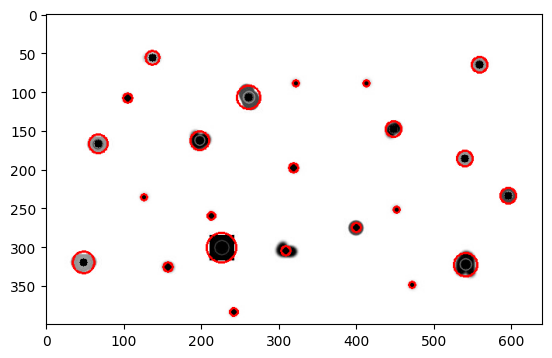

In [24]:
# Read image
im = cv2.imread("/home/ankan_opencv/officework/VS_Code/Noteboks-indore-talk/indore-talk-2024/blob_detection.jpg", cv2.IMREAD_GRAYSCALE)

# Set up the detector with default parameters.
detector = cv2.SimpleBlobDetector_create()

keypoints = detector.detect(im)

im = cv2.cvtColor(im, cv2.COLOR_GRAY2BGR)

# Mark blobs using image annotation concepts we have studied so far
for k in keypoints:
    x,y = k.pt
    x=int(round(x))
    y=int(round(y))
    # Mark center in BLACK
    cv2.circle(im,(x,y),5,(0,0,0),-1)
    # Get radius of blob
    diameter = k.size
    radius = int(round(diameter/2))
    # Mark blob in RED
    cv2.circle(im,(x,y),radius,(0,0,255),2)

# Let's see what image we are dealing with
plt.imshow(im[:,:,::-1])

## Edge Detection

In [ ]:
# Convert to graycsale
img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Blur the image for better edge detection
img_blur = cv2.GaussianBlur(img_gray, (3,3), 0)

# Sobel Edge Detection
sobelx = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv2.Sobel(src=img_blur, ddepth=cv2.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection
# Display Sobel Edge Detection Images
cv2.imshow('Sobel X', sobelx)
cv2.waitKey(0)
cv2.imshow('Sobel Y', sobely)
cv2.waitKey(0)
cv2.imshow('Sobel X Y using Sobel() function', sobelxy)
cv2.waitKey(0)

# Canny Edge Detection
edges = cv2.Canny(image=img_blur, threshold1=100, threshold2=200) # Canny Edge Detection
# Display Canny Edge Detection Image
cv2.imshow('Canny Edge Detection', edges)
cv2.waitKey(0)

cv2.destroyAllWindows()